# DSMCER Lecture 4: Intro to supervised ML using KNN

1. SML Overview
    1. Format of the general problem
    2. DES data load and explore
    3. Poll: has the model done well?
    4. Sklearn intro
    5. Data splitting
2. Create. our first SML model
    1. What is a KNN?
    2. _Exercise_: compute N dimensional distance
    3. Nominal encoding
    4. _Poll_: How many features will we have after encoding?
    5. Train and test the model
3. Standardization
    1. _Exercise_: feature dependant distances
    2. Standard scaler
    3. _Exercise_: repeat the training and testing of the KNN, but use normalized features

In [1]:
import numpy as np
import pandas as pd
import scipy.stats

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
sns.set_context('talk')

# ! NEW
import sklearn.preprocessing
import sklearn.model_selection
import sklearn.neighbors

***
***

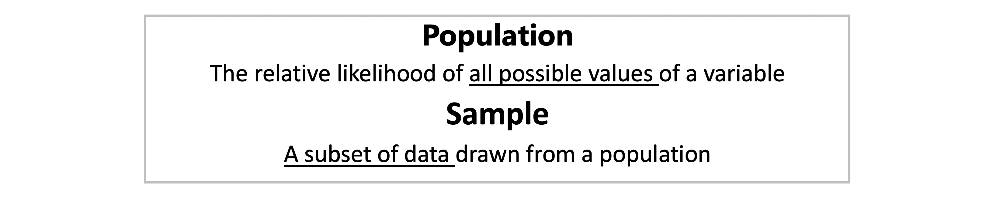

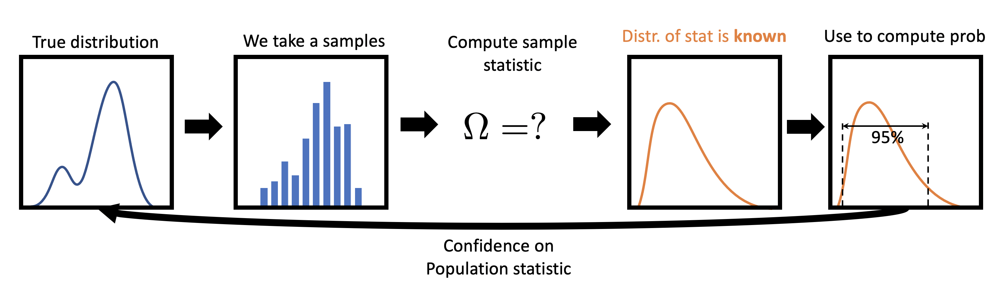

<font size=5><center>These techniques help us evaluate data to __prepare a machine learning model and to evaluate the model__.

***

## 1. SML Overview

### A. Format of the general problem

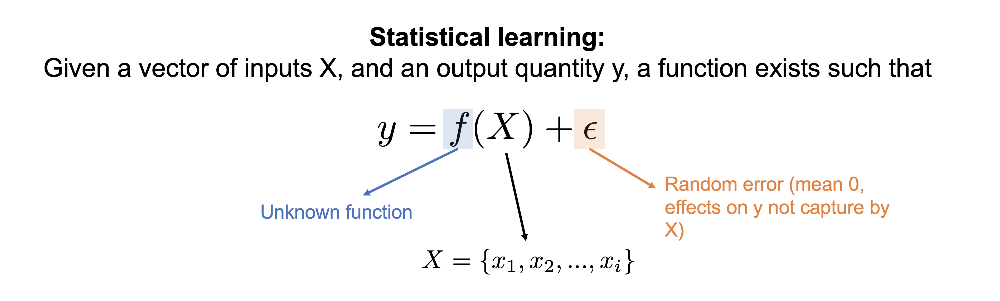

<font size=6><center>Imagine $y$ is expensive to measure or hard to come by, but $X$ we can acquire easily.

***

<font size=5><center>In SML, our goal is to __make an estimate of $f(X)$ so that we can predict $y$__ without having to measure it!

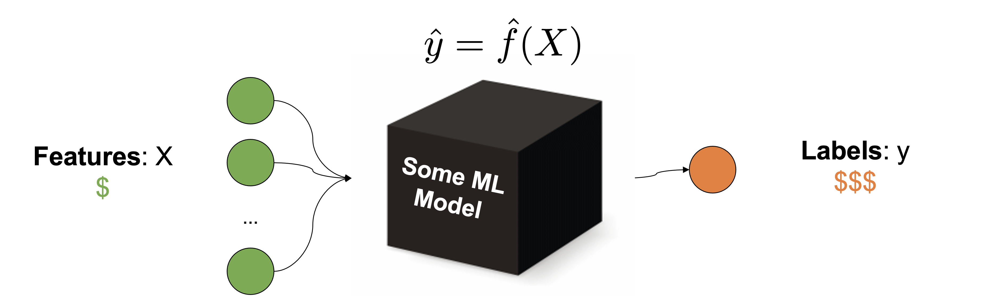

<font size=5><center>In order to create $\hat{f}(X)$ we must already have some data with $X$ and $y$. This is the what makes an SML problem SML - __every example in our starting data requires labels__.

***

<font size=5><center>Once we decide on the form of the model (hyperparameters), __we can determine the model's parameters through training__ using the labeled data that we have.

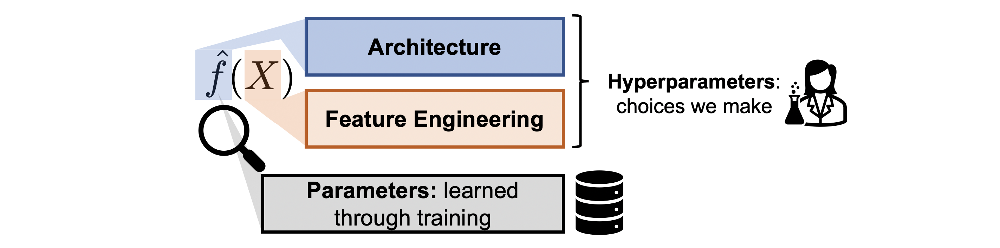

***

### B. DES data load and explore

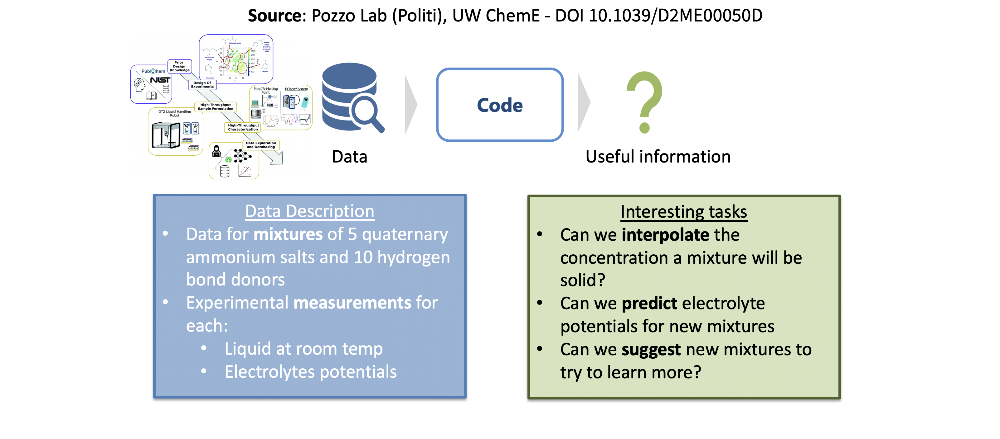

<font size=5><center>We will start off by focusing on the first task: __can we create a model to determine if a new mixture of these components will be solid or not?__

***

<font size=4>Let's load the data and do a bit of exploration.

In [2]:
df = pd.read_csv('../../datasets/Politi_DES/politi_des_reformatted.csv', index_col=0)

In [3]:
df.head()

,QAS,HBD,QAS_xf,conductivity,cathodic_slope,anodic_slope,cathodic_potential,anodic_potential,potential_window,solid
0,Choline Chloride,Ethylene Glycol,0.10,5.493,2.903,4.032,-1.556,1.133,2.689,False
1,Choline Chloride,Ethylene Glycol,0.20,5.672,3.355,2.399,-1.561,1.128,2.689,False
2,Choline Chloride,Ethylene Glycol,0.30,8.334,4.073,4.678,-1.648,1.127,2.775,False
3,Choline Chloride,Ethylene Glycol,0.35,7.230,4.042,4.230,-1.661,1.131,2.792,False
4,Choline Chloride,Ethylene Glycol,0.40,8.008,4.204,4.795,-1.670,1.145,2.815,False


In [4]:
df.describe()

,QAS_xf,conductivity,cathodic_slope,anodic_slope,cathodic_potential,anodic_potential,potential_window
count,600.000000,230.000000,230.000000,230.000000,195.000000,195.000000,195.000000
mean,0.487500,1.521357,1.252883,1.238013,-1.911533,1.226564,3.138123
std,0.228522,2.348966,1.137035,1.286225,0.330444,0.198202,0.403170
min,0.100000,0.001000,0.003000,0.001000,-3.616000,0.936000,2.272000
25%,0.337500,0.220750,0.364500,0.295500,-1.897500,1.162000,2.962000
50%,0.475000,0.668500,0.818500,0.699000,-1.843000,1.195000,3.032000
75%,0.625000,1.709500,1.953250,1.819250,-1.784000,1.231500,3.139500
max,0.900000,19.630000,4.398000,5.758000,-1.137000,2.904000,4.898000


QAS options

In [5]:
df['QAS'].unique()

array(['Choline Chloride', 'Acetylcholine Chloride',
       'Tetraethylammonium Chloride', 'Tetrapropylammonium Bromide',
       'Tetraethylammonium Iodide'], dtype=object)

HBD options

In [6]:
df['HBD'].unique()

array(['Ethylene Glycol', 'Glycerol', 'Acetamide', 'N,N-dimethylurea',
       '3-phenylpropionic acid', 'Urea', 'L-serine', '4-amino triazole',
       'Xylitol', 'Phenylacetic acid'], dtype=object)

How many samples were solid

In [7]:
df['solid'].value_counts()

True     405
False    195
Name: solid, dtype: int64

Which measurements are missing.

In [8]:
df.isna().sum(axis=0)

QAS                     0
HBD                     0
QAS_xf                  0
conductivity          370
cathodic_slope        370
anodic_slope          370
cathodic_potential    405
anodic_potential      405
potential_window      405
solid                   0
dtype: int64

<font size=4>__Two nominal fields__: 'QAS' and 'HBD' which indicate what quarternary ammonium salt and which hydrogen bond doner are used. __Another nominal__ field 'solid' which indicates whether the mixture was solid or not. About 2/3 of the data was solid. __A quantititative field 'QAS_xf'__ which is the molar ratio of QAS to HBD 

<font size=4>__The other data fields are quantitative measures__ for the samples that were not solid:

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


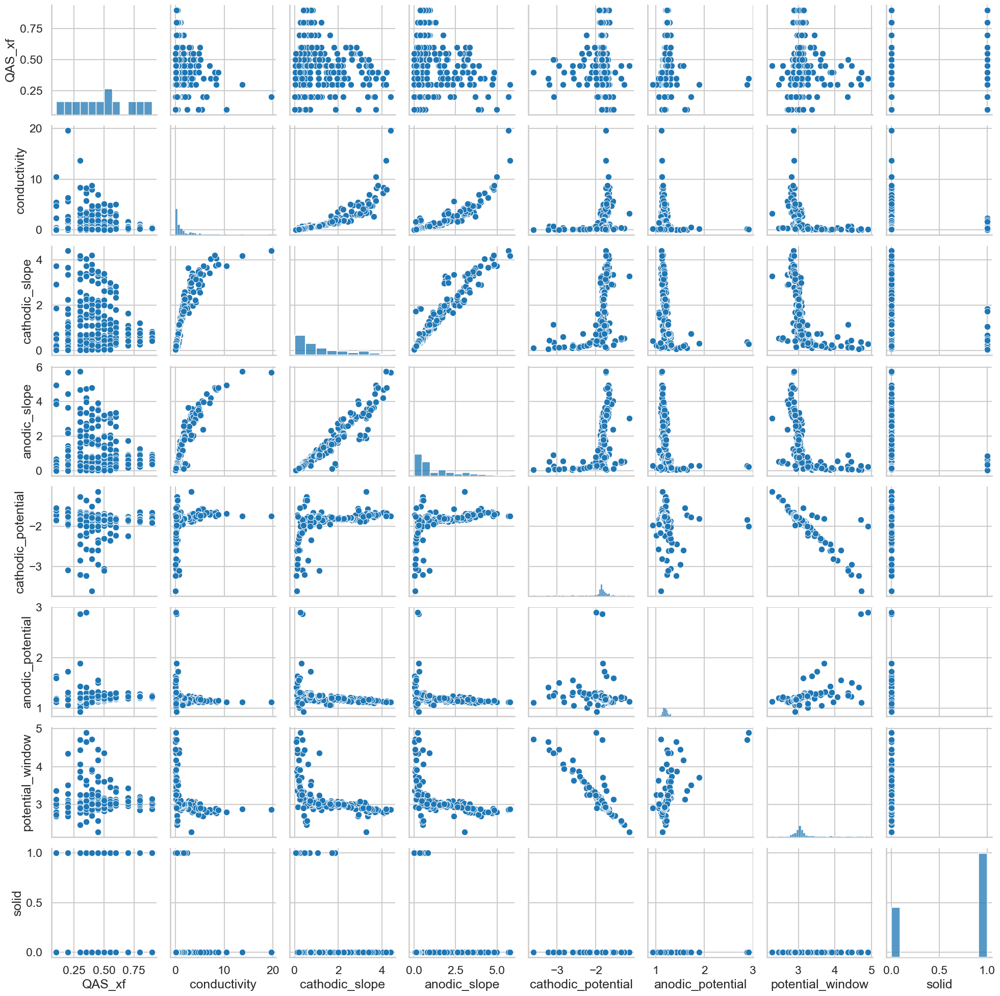

In [9]:
sns.pairplot(df)

<font size=4>There are clearly some relationships that can be observed within the quantitative data.

<font size=5><center>Consider our goal - __we do not want to have to make a sample in order to predict if it is solid__, so we cannot use any of the quantitative measures. So our problem looks like this:

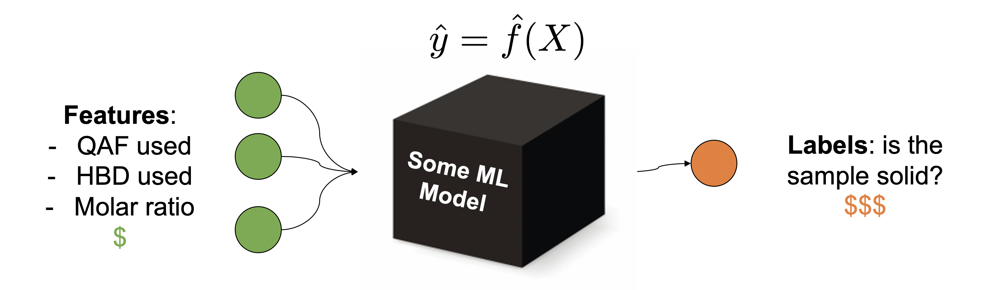

<font size=4>Drop all but the useful columns.

In [10]:
df = df.drop(columns=['conductivity', 'cathodic_slope',
       'anodic_slope', 'cathodic_potential', 'anodic_potential',
       'potential_window'])

In [11]:
df.head()

,QAS,HBD,QAS_xf,solid
0,Choline Chloride,Ethylene Glycol,0.10,False
1,Choline Chloride,Ethylene Glycol,0.20,False
2,Choline Chloride,Ethylene Glycol,0.30,False
3,Choline Chloride,Ethylene Glycol,0.35,False
4,Choline Chloride,Ethylene Glycol,0.40,False


In [12]:
df['QAS'].value_counts()

Choline Chloride               120
Acetylcholine Chloride         120
Tetraethylammonium Chloride    120
Tetrapropylammonium Bromide    120
Tetraethylammonium Iodide      120
Name: QAS, dtype: int64

In [13]:
df['HBD'].value_counts()

Ethylene Glycol           60
Glycerol                  60
Acetamide                 60
N,N-dimethylurea          60
3-phenylpropionic acid    60
Urea                      60
L-serine                  60
4-amino triazole          60
Xylitol                   60
Phenylacetic acid         60
Name: HBD, dtype: int64

<font size=4>We tried each HBD and QAS an equal number of times. 

***

### C. Poll: Has the model done well?

<font size=5><center>__We compute metrics measuring the performance__ of the model on __any set of data__ that we have labels for eg. error (bad), or accuracy (good):

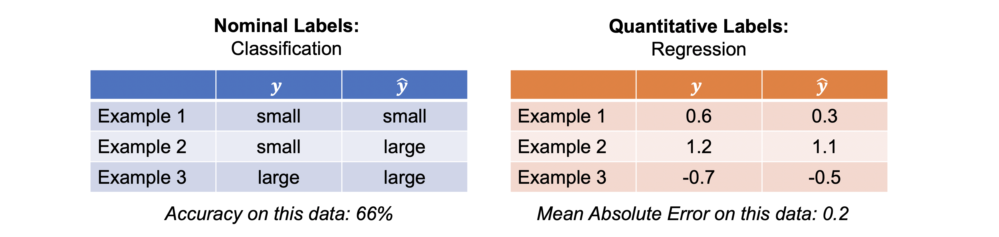

<font size=5><center>__If our target is continuous, it is a regression task, where as if they are nominal, it is a classification task__.

<font size=4>Consider what we saw in the previous lectures regarding samples and populations. Assume we have created a model, and trained it using `Dataset A`. __The primary goal of our model is to make accurate predictions such that we do not need to take measurements in the future.__

<font size=4>1. Would you expect the model to have __better, worse, or the same accuracy__ on `Dataset A` as some other `Dataset B`?

<font size=4>2. Your model performs with accuracy A% on `Dataset A` and B% accuracy on `Dataset B`. __Which do you communicate to your boss__ to explain that you have met your primary goal? 

***

### C. Scikit-learn Intro

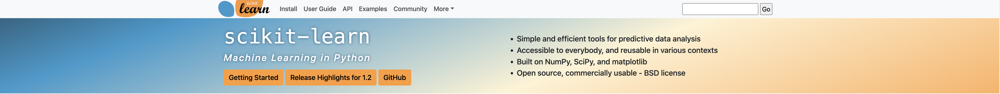

<font size=4>[sklearn](https://scikit-learn.org/stable/) is a python library that has prebuilt tools for all but the most complex/cutting edge machine learning tasks. This includes:
    
- <font size=4>Preparing data

- <font size=4>Creating and using a vast number of different ML architectures

- <font size=4>Selection and optimization of models
    
<font size=4>__Here you will get a little bit of the first two!__

### D. Data splitting

<font size=5><center>We have established that __if we want a model to make predictions on _new_ data__, then we should __evaluate the model on a set of data that is _new_ to it__. This other dataset is called the "hold-out set" or the "test set," and we create it by splitting some data out from the original dataset

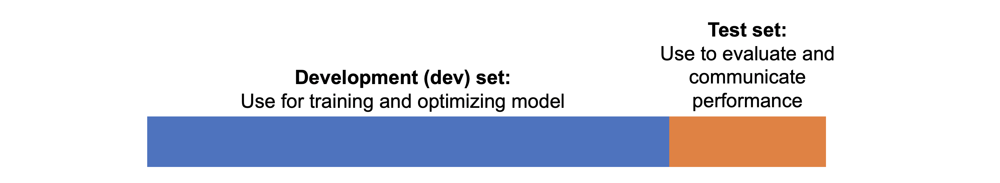

***

<font size=4>One way to consider doing this is randomly.

In [14]:
dev_data, test_data = sklearn.model_selection.train_test_split(df, test_size=0.15, random_state=777) # asking for 15% of the data to be test set

In [15]:
print(f"Amount of dev, test data: {(len(dev_data), len(test_data))}")

Amount of dev, test data: (510, 90)


<font size=5><center>__This test set is now our way of estimating the model quality on "new" data.__ However, we want to make sure that the __features in two datasets come from the same population__, otherwise we are asking the model to do something it is not prepared for:

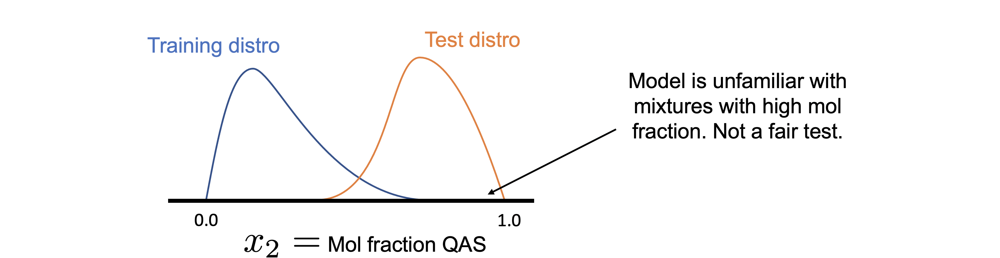

<font size=4>We can test this quickly with the boostrapped divergence metric from last lecture:

In [16]:
def metric_of_interest(data_sample_1, data_sample_2, axis=None):
    # get the min and max values to compute PDF
    global_minimum = min([data_sample_1.min(), data_sample_2.min()])
    global_maximum = min([data_sample_1.max(), data_sample_2.max()])
    width = global_maximum - global_minimum
    
    x = np.linspace(global_minimum - 0.1*width, global_maximum + 0.1*width, 1000)
    
    # create empirical PDFs for the samples
    s1_distro = scipy.stats.rv_histogram(np.histogram(data_sample_1))
    s2_distro = scipy.stats.rv_histogram(np.histogram(data_sample_2))
    
    # compute JSD
    JSD = scipy.spatial.distance.jensenshannon(s1_distro.pdf(x), s2_distro.pdf(x))
    return [JSD,]

In [17]:
print('Interval: ', scipy.stats.bootstrap(
    (dev_data['QAS_xf'], test_data['QAS_xf']),
    metric_of_interest,
    n_resamples=1000,
    batch=5,
    method='percentile'
))

Interval:  BootstrapResult(confidence_interval=ConfidenceInterval(low=0.08477536957756901, high=0.15836900576391894), standard_error=0.016867805853231718)


<font size=4>__JSD is close to 0.0, distributions are similar!__

## 2. Train and test a KNN

### A. What is a KNN

<font size=5><center>Consider the following data with features $x_0$ and $x_1$ and target $y$:

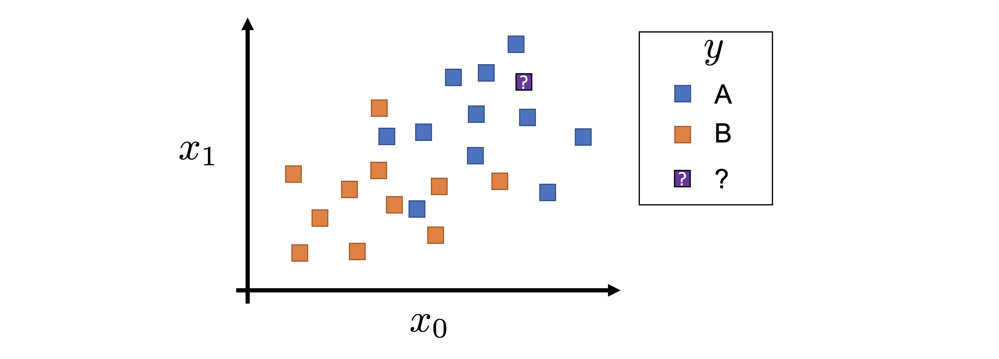

<font size=5><center>By inspection we would expect the new data point to be class A. K-Nearest Neigbor models (KNNs) formalize this principle using distance, in this example for 2 dimensions:

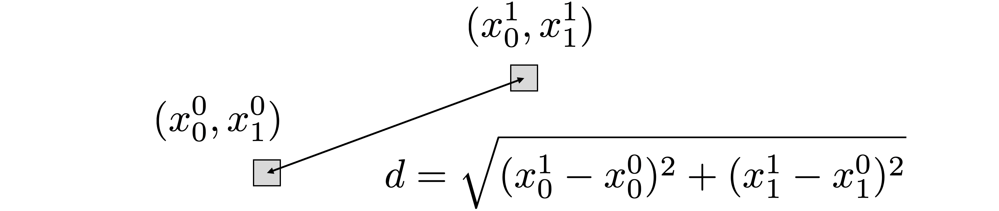

<font size=5><center>The KNN __assigns $y$ for a new example as the average value of $y$ among $K$ nearest training examples__. This can be done for >2 dimensions.

### B. _Exercise_: compute N dimensional distance

Consider a setting where you have 5 features. Compute the distance between the given examples `a` and `b`.

In [18]:
a = np.array([0.2, 0.8, 0.5, 0.9, 0.4])
b = np.array([0.6, 0.9, 0.3, 0.3, 0.4])

> <span style='color:red'>remove for lecture

In [19]:
def distance(a, b):
    differences = b - a
    square_differences = differences**2
    return np.sqrt(sum(square_differences))

In [20]:
print(f"Distance between a and b is: {distance(a, b)}")

Distance between a and b is: 0.754983443527075


### C. Data encoding

<font size=4>Compute the distance between example 0 and example 1 in the dev dataset:

In [21]:
dev_data.head()

,QAS,HBD,QAS_xf,solid
241,Tetraethylammonium Chloride,Ethylene Glycol,0.20,False
132,Acetylcholine Chloride,Glycerol,0.10,False
267,Tetraethylammonium Chloride,Acetamide,0.35,False
12,Choline Chloride,Glycerol,0.10,False
529,Tetraethylammonium Iodide,3-phenylpropionic acid,0.20,True


<font size=4> Uh... what is the difference between Glycerol and Acetemide? __We cannot compute distances between nominal values__. Similar principles apply to models other than KNNs. We must encode our (nominal) data into numbers that a computer can understand.

<font size=5><center>__One-hot encoding__: each of the possible values of the feature gets its own column, and a $1$ for a particular exampl indicates which value the example has.

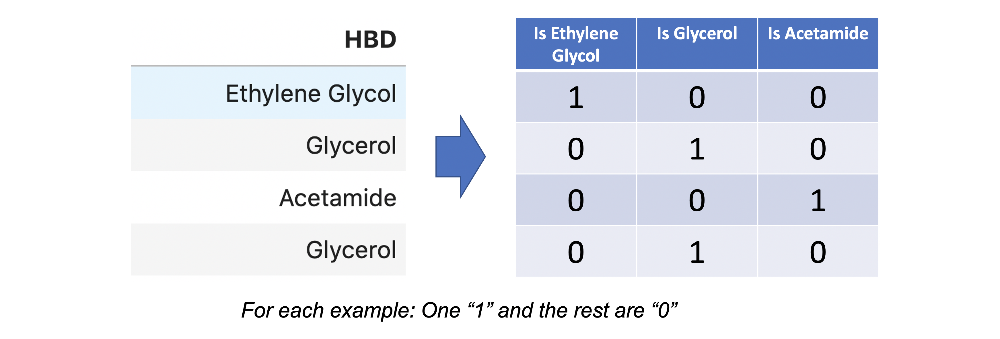

### D. _Poll_: how many features will we have after encoding?

<font size=4> We currently have 3 X columns:

- <font size=4> Which HBD is used (__nominal__)

- <font size=4> Which QAS is used (__nominal__)
    
- <font size=4> Molar ratio of (__quantitative__)
    
<font size=4> __How many total columns will we have after nominal encoding?__ (if you run the next section to find out you will be cursed with 10,000 years of bad luck.)

***

<font size=4> `sklearn` gives us a way to do this encoding really fast

In [22]:
# create encoder object
encoder = sklearn.preprocessing.OneHotEncoder(sparse=False)
# fit and encode the QAS feature
encoder.fit_transform(dev_data['QAS'].values.reshape(-1,1))

array([[0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       ...,
       [0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0.]])

<font size=4> We got five columns because there are five possible Quaternary Ammonium Salts in the data. We have to do this to every nominal feature:

In [23]:
def seperate_nominal_features(dataframe, target_name, nominal_features=[]):
    # get y values
    y = dataframe[target_name].values.reshape(-1,1)
    
    # get all other columns
    quantitative_features = [c for c in dataframe.columns if c not in nominal_features and c != target_name]
    
    # return the data seperated
    return {
        'nominal_X': dataframe[nominal_features].values,
        'quantitative_X': dataframe[quantitative_features].values,
        'y': y
    }

In [24]:
dev_data = seperate_nominal_features(dev_data, target_name='solid', nominal_features=['QAS', 'HBD'])

In [25]:
test_data = seperate_nominal_features(test_data, target_name='solid', nominal_features=['QAS', 'HBD'])

In [26]:
print(f"Nominal features have been seperated out: {dev_data['nominal_X']}")

Nominal features have been seperated out: [['Tetraethylammonium Chloride' 'Ethylene Glycol']
 ['Acetylcholine Chloride' 'Glycerol']
 ['Tetraethylammonium Chloride' 'Acetamide']
 ...
 ['Choline Chloride' 'Urea']
 ['Tetraethylammonium Iodide' '4-amino triazole']
 ['Choline Chloride' 'Xylitol']]


In [27]:
# "fit" encoding
encoder = sklearn.preprocessing.OneHotEncoder(sparse=False)
encoder.fit(dev_data['nominal_X'])

# transform the data in both datasets
dev_data['nominal_X'] = encoder.transform(dev_data['nominal_X'])
test_data['nominal_X'] = encoder.transform(test_data['nominal_X'])

In [28]:
# concatenate the encoded nominal features and the quantitative features back together
dev_X = np.concatenate([dev_data['nominal_X'], dev_data['quantitative_X']], axis=1)
test_X = np.concatenate([test_data['nominal_X'], test_data['quantitative_X']], axis=1)

# asign y data to new variables
dev_y = dev_data['y']
test_y = test_data['y']

In [29]:
print(f"Shape of X, y data for the dev set: ", dev_X.shape, dev_y.shape)
print(f"Shape of X, y data for the test set: ", test_X.shape, test_y.shape)

Shape of X, y data for the dev set:  (510, 16) (510, 1)
Shape of X, y data for the test set:  (90, 16) (90, 1)


<font size=4> We have 16 features from the encoding, 510 dev examples, and 90 test examples. Let's visually check that these 16 features have similar distributions between dev and test:

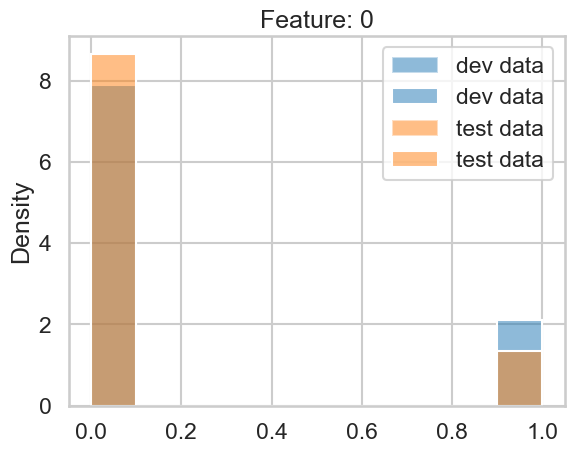

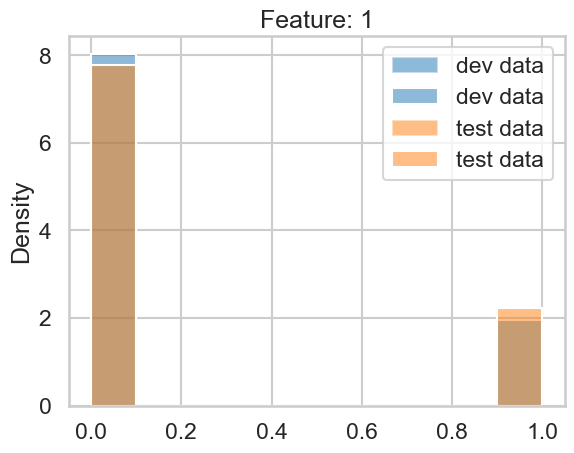

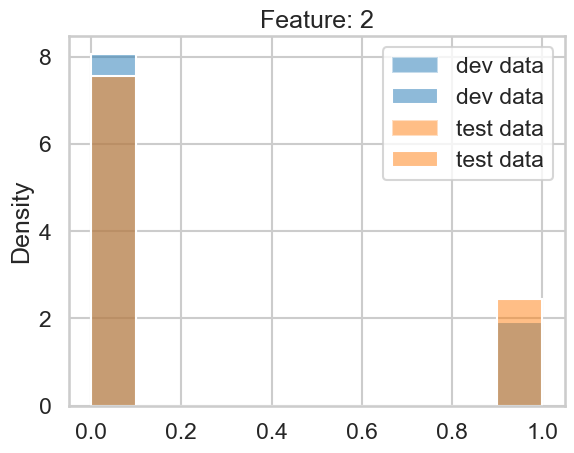

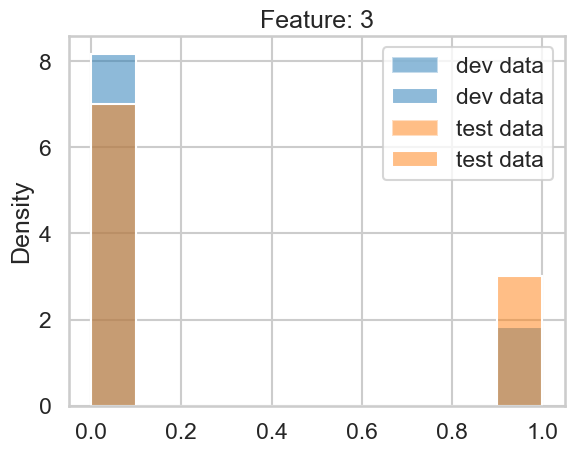

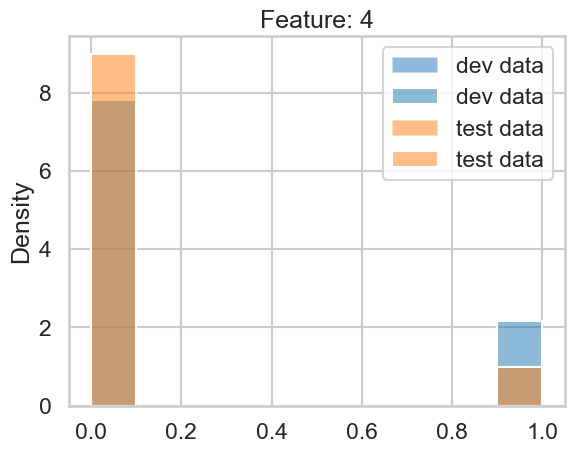

...

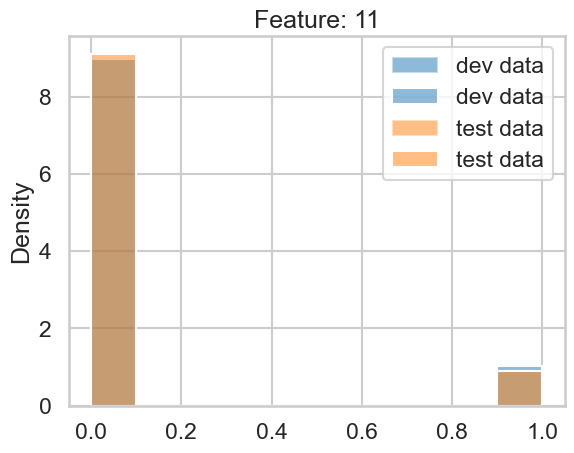

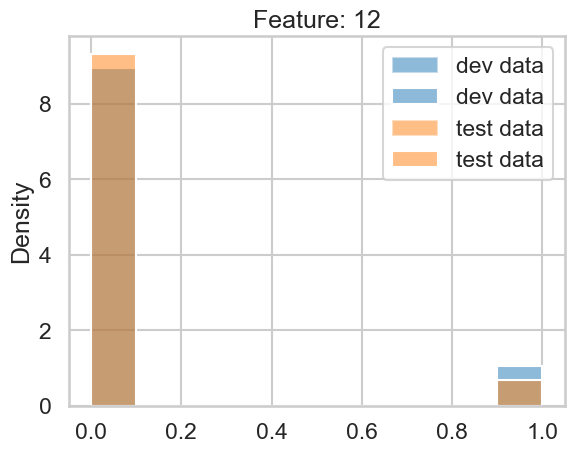

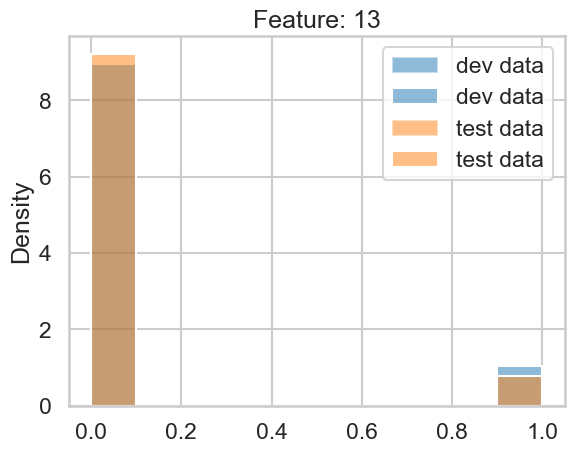

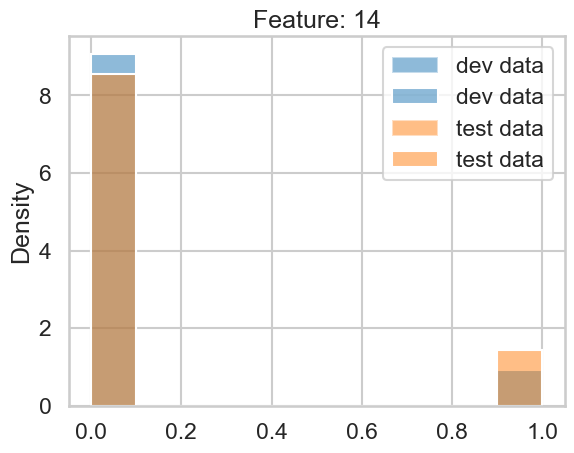

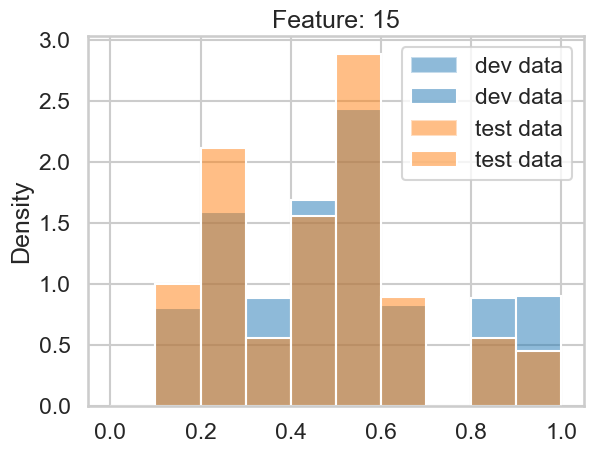

In [30]:
# loop over features
for i in range(dev_X.shape[1]):
    
    # create KDE of data
    fig, ax = plt.subplots()
    sns.histplot(x=dev_X[:,i], label='dev data', ax=ax, stat='density', binrange=(0,1), bins=10, alpha=.5)
    sns.histplot(x=test_X[:,i], label='test data', ax=ax, stat='density', binrange=(0,1), bins=10, alpha=.5)
    ax.set_title(f"Feature: {i}")
    ax.legend()

<font size=4> Every possible value of features are represented in both set! We are not asking the model to predict outside of its scope.

### E. Train and test the model

<font size=4> Now that we finally have X and y data (represented as numbers) for each of a development dataset and a test set, we are ready to create, train, and evaluate a model. `sklearn` has KNN code ready to go.

In [31]:
# create a KNN classifier model, since we are doing classification and not regression
model = sklearn.neighbors.KNeighborsClassifier()

In [32]:
# train the model using the training data
model.fit(dev_X, dev_y) # pass X and y values

/opt/anaconda3/envs/DSMCER_general_env/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:207: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [33]:
# test the model with the test data
model.score(test_X, test_y)

0.8

In [34]:
# make predictions
preds = model.predict(test_X)
print(preds)

[False  True  True  True  True False  True  True False  True  True False
  True  True  True  True  True False  True  True  True  True False  True
 False  True False  True False  True  True  True False  True False  True
  True  True  True False False  True False False  True  True  True  True
 False False  True  True  True False  True  True  True  True  True  True
  True  True  True  True False  True False False  True  True  True False
 False False False False  True  True False  True  True False False False
  True  True  True  True  True  True]


<font size=4> We achieved 0.8 accuracy on on the test set. It is often helpful to look at the confusion matrix:

/opt/anaconda3/envs/DSMCER_general_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


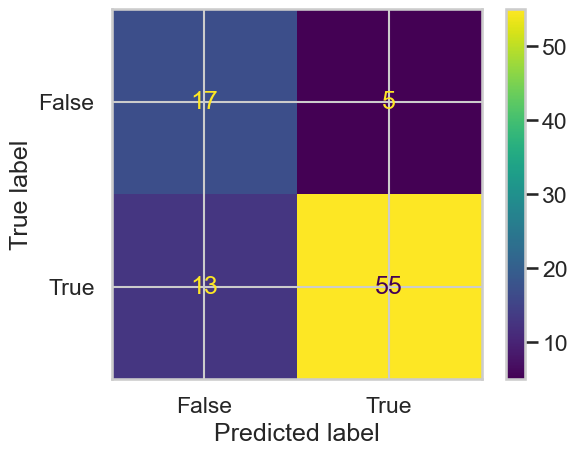

In [35]:
sklearn.metrics.plot_confusion_matrix(model, test_X, test_y)

<font size=4> We incorrectly labeled a solid sample as not solid more than we did label a liquid sample as solid. But this may be due to the data imbalance:

In [36]:
df['solid'].value_counts()

True     405
False    195
Name: solid, dtype: int64

<font size=4> There are more solids than liquids, so there is more opportunity to get a solid prediction wrong. We can get some stats from confusion matrix above:

In [37]:
print(sklearn.metrics.classification_report(test_y, preds))

              precision    recall  f1-score   support

       False       0.57      0.77      0.65        22
        True       0.92      0.81      0.86        68

    accuracy                           0.80        90
   macro avg       0.74      0.79      0.76        90
weighted avg       0.83      0.80      0.81        90



<font size=4> __Precision__: portion of predictions you made were correct. __Recall__: portion of the true values that you got correct.
    
<font size=4> __What you care about the most is problem dependant.__ For example, if we wanted to make sure that _we never had to make a sample that was solid_ we would want a _high precision_. On the other hand, if we wanted to make sure that _we never missed a sample that was liquid_ we would want a _high recall_.

<font size=4> One metric that is typically quite representative is the area under the reciever operating curve:

/opt/anaconda3/envs/DSMCER_general_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


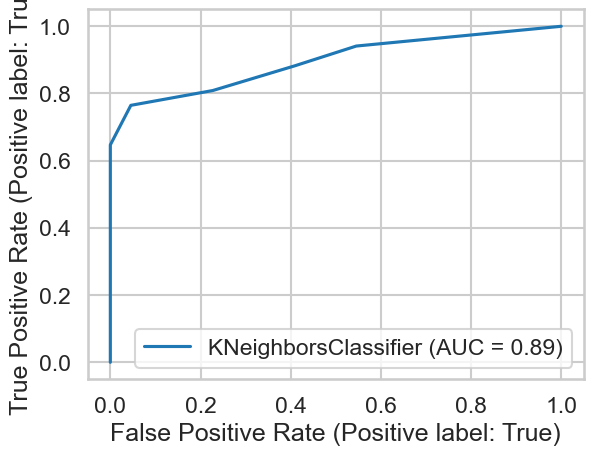

In [38]:
sklearn.metrics.plot_roc_curve(model, test_X, test_y)

## 3. Data standardization

### A. _Exercise_: feature dependant distances

<font size=4> Let's add another feature to our data: __molar mass of the HBD__

In [39]:
molwts = {
    'Ethylene Glycol': 62.036779432,
    'Glycerol': 92.047344116,
    'Acetamide': 59.03711378,
    'N,N-dimethylurea': 88.063662876,
    '3-phenylpropionic acid': 150.06807956,
    'Urea': 60.032362748,
    'L-serine': 105.042593084,
    '4-amino triazole': 84.04359612799999,
    'Xylitol': 152.068473484,
    'Phenylacetic acid': 136.052429496}

In [40]:
df['HBD_mass'] = df['HBD'].apply(molwts.get)

<font size=4> Consider a KNN using only two features: the mol fraction of QAS and the molar mass of HBD.

In [41]:
X = df[['QAS_xf', 'HBD_mass']]
X

,QAS_xf,HBD_mass
0,0.10,62.036779
1,0.20,62.036779
2,0.30,62.036779
3,0.35,62.036779
4,0.40,62.036779
...,...,...
595,0.55,136.052429
596,0.60,136.052429
597,0.70,136.052429
598,0.80,136.052429


<font size=4> __Compute distances between the first example and all other examples (599 distances)__. Do this for each feature individially as well as the 2D distance. Create a plot or compute a metric that shows the relationship between distances of each feature individually and the total distance.

> <span style='color:red'>remove for lecture

In [42]:
first_example = X.iloc[0]

In [43]:
def compute_distances(row):
    QAS_xf_distance = np.abs(row['QAS_xf'] - first_example['QAS_xf'])
    HBD_mass_distance = np.abs(row['HBD_mass'] - first_example['HBD_mass'])
    
    twoD_distance = np.sqrt(sum((row.values - first_example.values)**2))
    
    return [QAS_xf_distance, HBD_mass_distance, twoD_distance]

In [44]:
distances = []
for i, row in X.iloc[1:].iterrows():
    distances.append(compute_distances(row))

distances=pd.DataFrame(data=np.array(distances), columns=['QAS_xf distance', 'HBD_mass distance', 'total distance'])

In [45]:
distances.corr()

,QAS_xf distance,HBD_mass distance,total distance
QAS_xf distance,1.000000,-0.003247,-0.002287
HBD_mass distance,-0.003247,1.000000,0.999993
total distance,-0.002287,0.999993,1.000000


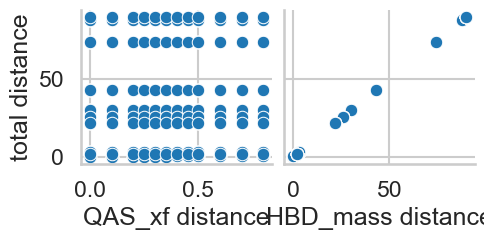

In [46]:
sns.pairplot(distances, x_vars=['QAS_xf distance', 'HBD_mass distance'], y_vars='total distance')

<font size=5><center> We can see that the __total distance is almost entirely dependant on `HBD_mass`__. Why?

<font size=4> Consider these two examples:

In [47]:
X.iloc[11:13]

,QAS_xf,HBD_mass
11,0.9,62.036779
12,0.1,92.047344


<font size=4> The difference in mol fraction is 0.8, which is __conceptually very large__, while the difference in molar mass is ~30 g/mol __which is conceptually not very large__.

### B. MinMax Scaler

<font size=5><center> __Distance is arbitrarilly affected by the magnitude of the feature measurement.__ We must normalize these magnitudes over features.

<font size=4> One way to do this is with `sklearn`s `MinMaxScaler` which simply squeezes the data so that each feature has a min of 0 and a max of 1 in the data. Another way is standardization, which makes the mean and standard deviation of each feature within the dataset 0.0 and 1.0. Keep in mind that there are other ways to do this normalization, but these two are  are common. 

In [49]:
scaler = sklearn.preprocessing.MinMaxScaler()
scaler.fit(X)

MinMaxScaler()

In [50]:
normed_X = scaler.transform(X)

In [51]:
normed_X.min(axis=0)

array([0., 0.])

In [52]:
normed_X.max(axis=0)

array([1., 1.])

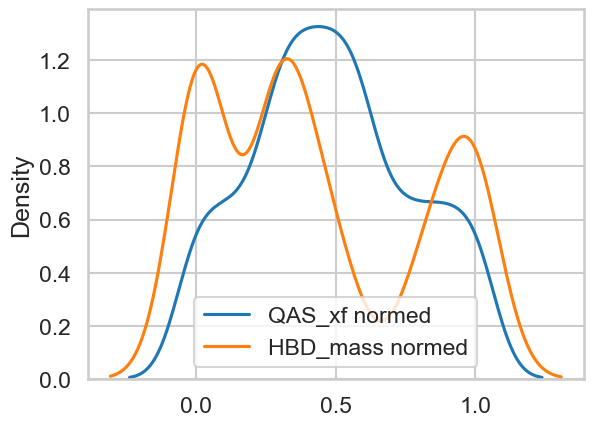

In [53]:
fig, ax = plt.subplots()
sns.kdeplot(x=normed_X[:,0], ax=ax, label='QAS_xf normed')
sns.kdeplot(x=normed_X[:,1], ax=ax, label='HBD_mass normed')
plt.legend()

<font size=5><center> While molar mass can be >>1.0 and the molar fraction is between 0.0 and 1.0, after standardization the two features have the same magnitude, so will not arbitrarily affect the distance.

### C. _Exercise_: repeat the training and testing of the KNN, but use standardized features

<font size=4>Use the dev and test data from above which have HBD and QAS encoded, as well as the one quantitative feature. Standardize the features in this data to repeat the training and testing of the KNN

> <span style='color:red'>remove for lecture

In [55]:
# initialize the scaler and fit it to the dev data eg determine the means and standard deviations of the features
scaler = sklearn.preprocessing.MinMaxScaler()
scaler.fit(dev_X)

MinMaxScaler()

In [56]:
# transform the features
dev_X = scaler.transform(dev_X)
test_X = scaler.transform(test_X)

In [57]:
# train the model using the training data
model.fit(dev_X, dev_y) # pass X and y values

/opt/anaconda3/envs/DSMCER_general_env/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:207: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [58]:
# test the model with the test data
model.score(test_X, test_y)

0.7888888888888889

<font size=4> Notice how the scaler is fit to the dev data? That is because __if we allowed it to be fit using any test data, then the model has knowledge of the test data mean and standard deviation__ by proxy. This leads to the most important tenet of ML:

<font size=5><center> __The model must never have any knowledge of the test data through training or optimization, such that the test set can serve as a good test of performance on _unseen_ data.__

## Summary

<font size=4> We explored:
    
- <font size=4> SML problems, where we aim to predict expensive quantities for __new__ data given what we can learn from data we have.

- <font size=4> How a K-Nearest Neighbor model makes predictions
    
- <font size=4> __A worked example of the basic steps of SML__: splitting the data, preprocessing data (eg feature encoding and standardization), model training, and model testing 